### Moving Constant Force Model (MCFM)

In [15]:
import sympy as sp

x,t,tau = sp.symbols("x t tau", real=True)

In [16]:
L = 20         # meters
EI = 2e6      # Nm²
m_b = 80      # kg/m
p0 = 500      # Newtons
v = 1         # m/s

In [17]:
def element(x,t,tau, L, EI, m_b, p0, v, j):
    omega_bj = (j*sp.pi / L)**2 * sp.sqrt(EI/m_b)
    duhamel = sp.sin(omega_bj * (t-tau)) / omega_bj * sp.sin(j*sp.pi*v*tau/L)
    q_bj = 2*p0/(m_b * L) * sp.integrate(duhamel, (tau, 0, t))
    return q_bj * sp.sin(j*sp.pi*x/L)

N = 3
y_b = sum([element(x,t,tau, L, EI, m_b, p0, v, j) for j in range(1, N+1)])


In [18]:
%matplotlib inline
from IPython.display import HTML
from matplotlib.animation import FuncAnimation

def animate_yb(y_b_expr, L=10, t_max=100, nx=100, nt=500):
    import numpy as np
    import matplotlib.pyplot as plt
    import sympy as sp
    from matplotlib.animation import FuncAnimation
    from IPython.display import HTML

    x, t = sp.symbols('x t')
    y_b_func = sp.lambdify((x, t), -y_b_expr, 'numpy')

    x_vals = np.linspace(0, L, nx)
    t_vals = np.linspace(0, t_max, nt)
    Y = np.array([y_b_func(x_vals, t_val) for t_val in t_vals])

    fig, ax = plt.subplots(figsize=(10, 4))
    line, = ax.plot([], [], lw=2)
    ax.set_xlim(0, L)
    ax.set_ylim(np.min(Y)*1.1, np.max(Y)*1.1)
    ax.set_xlabel('Position x [m]')
    ax.set_ylabel('Displacement y_b [m]')
    ax.set_title('Beam displacement over time')

    def init():
        line.set_data([], [])
        return line,

    def update(frame):
        line.set_data(x_vals, Y[frame])
        ax.set_title(f"t = {t_vals[frame]:.2f} s")
        return line,

    anim = FuncAnimation(fig, update, frames=len(t_vals), init_func=init, blit=True, interval=30)

    return HTML(anim.to_jshtml())




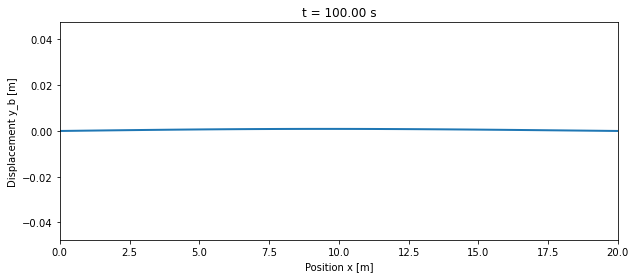

In [19]:
animate_yb(y_b,20)